In [43]:
import pymysql
from collections import defaultdict
import pandas as pd
import sqlalchemy
%matplotlib inline
import requests
from matplotlib.colors import ListedColormap
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math
#from colormaps import _magma_data

In [5]:
# Database connection
    conn = pymysql.connect(user='root', password='root', database='acb', host='localhost')

    # Load the data into a Pandas DataFrame
    query = "select * from shotchart"
    shot_df = pd.read_sql(query, conn)
    shot_df
    
    # Load the data into a Pandas DataFrame
    query = "select * from teamname"
    team_df = pd.read_sql(query, conn)
    
    # Load the data into a Pandas DataFrame
    query = "select * from actor"
    actor_df = pd.read_sql(query, conn)

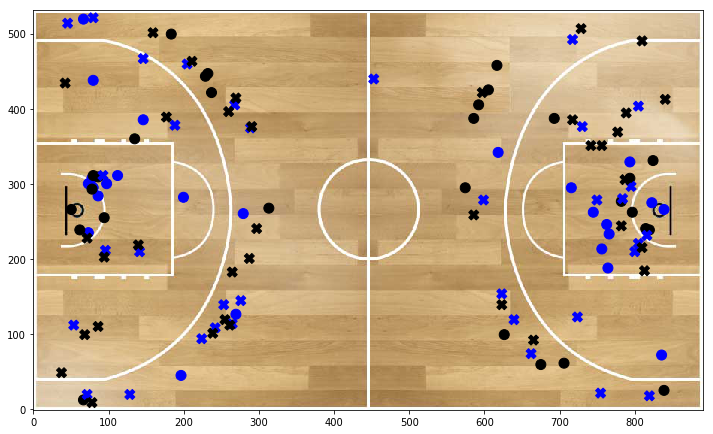

In [7]:
img=mpimg.imread('fiba_courtonly.png')

game_shotchart = shot_df[shot_df.game_acbid == 63149]
teams=game_shotchart.team_id.unique()

colors = np.where(game_shotchart.team_id==teams[0],'blue','black')
aux1=game_shotchart[game_shotchart['scored']==1]
aux2=game_shotchart[game_shotchart['scored']==0]
colors1=np.where(aux1.team_id==teams[0],'blue','black')
colors2=np.where(aux2.team_id==teams[0],'blue','black')

plt.figure(figsize=(12,22))
plt.scatter(aux1.left_px*img.shape[1]/100,aux1.botton_px*img.shape[0]/100,c=colors1,marker='o',s=100)
plt.scatter(aux2.left_px*img.shape[1]/100,aux2.botton_px*img.shape[0]/100,c=colors2,marker='X',s=100)

imgplot = plt.imshow(img, origin='lower')
plt.show()

(532, 891, 3)


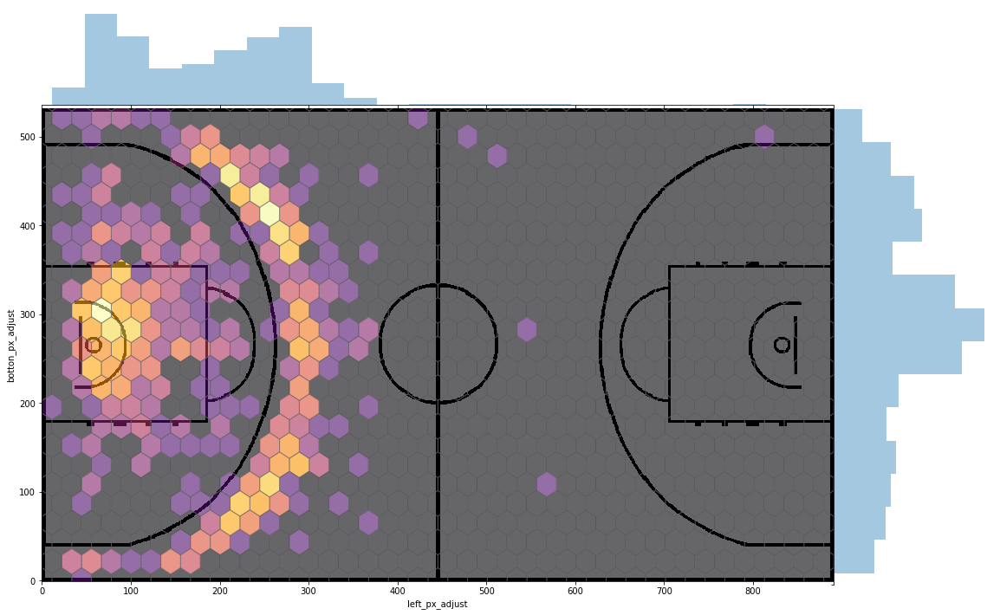

In [27]:
# create our jointplot
aux_df=shot_df[(shot_df.actor_id==9)]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut_WB.png')
print(img.shape)

cmap=plt.cm.inferno
cmap2=plt.cm.inferno

# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100,
                                alpha=0,space=0)


joint_shot_chart.plot_joint(plt.hexbin, gridsize=40,bins='log', extent=[img.shape[1], 0, 0, 1000],
                            alpha=0.6, cmap=plt.cm.inferno,color="#666668")

joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint
ax.imshow(img, origin='lower')

plt.show()

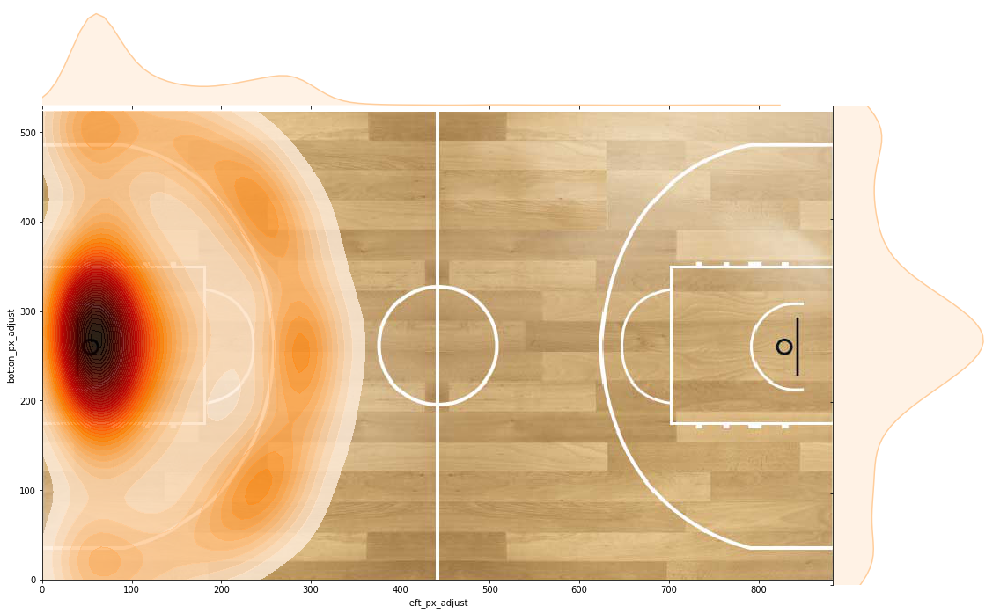

In [24]:
from matplotlib.offsetbox import  OffsetImage

# create our jointplot
aux_df=shot_df[(shot_df.team_id==1) & (shot_df.game_acbid>=63000)]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut.png')

cmap=plt.cm.gist_heat_r

# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100, 
                                stat_func=None,
                                 kind='kde', space=0, color=cmap(0.1),
                                 cmap=cmap,n_levels=50, alpha=0.8,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                 joint_kws={"shade_lowest":False})

joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint
ax.imshow(img, origin='lower')

plt.show()

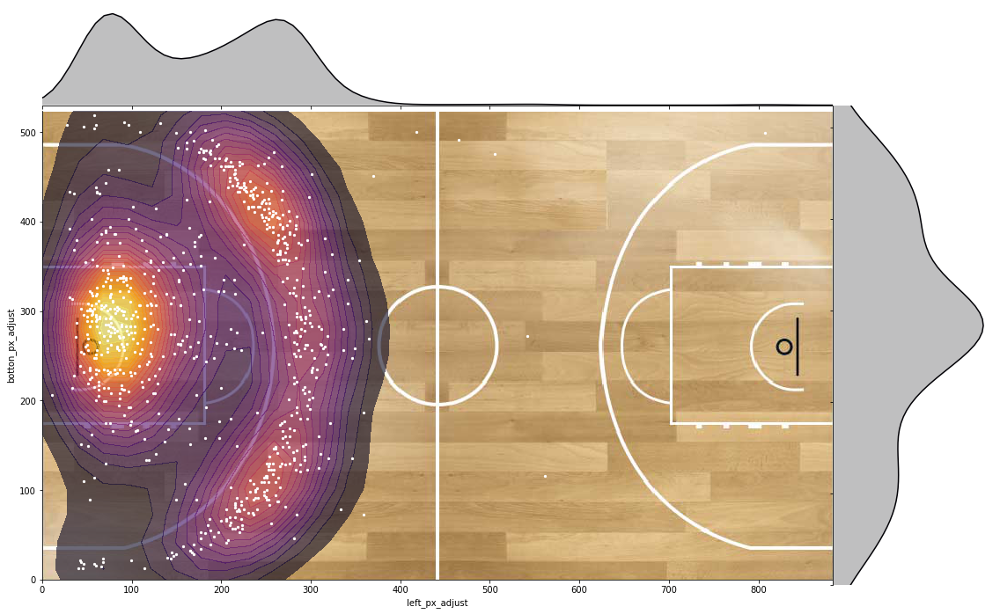

In [30]:
# create our jointplot
aux_df=shot_df[(shot_df.actor_id==9) ]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut.png')

# construct cmap
# Register and set Viridis as the colormap for the plot
cmap=plt.cm.inferno


# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100, 
                                stat_func=None,
                                 kind='kde',space=0,color=cmap(1),
                                 cmap=cmap, n_levels=30,alpha=0.6,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                 joint_kws={"cut":30,"shade_lowest":False})

joint_shot_chart.plot_joint(plt.scatter, c="w", s=5, linewidth=1, marker="o")


joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)


# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint

ax.imshow(img, origin='lower')

plt.show()

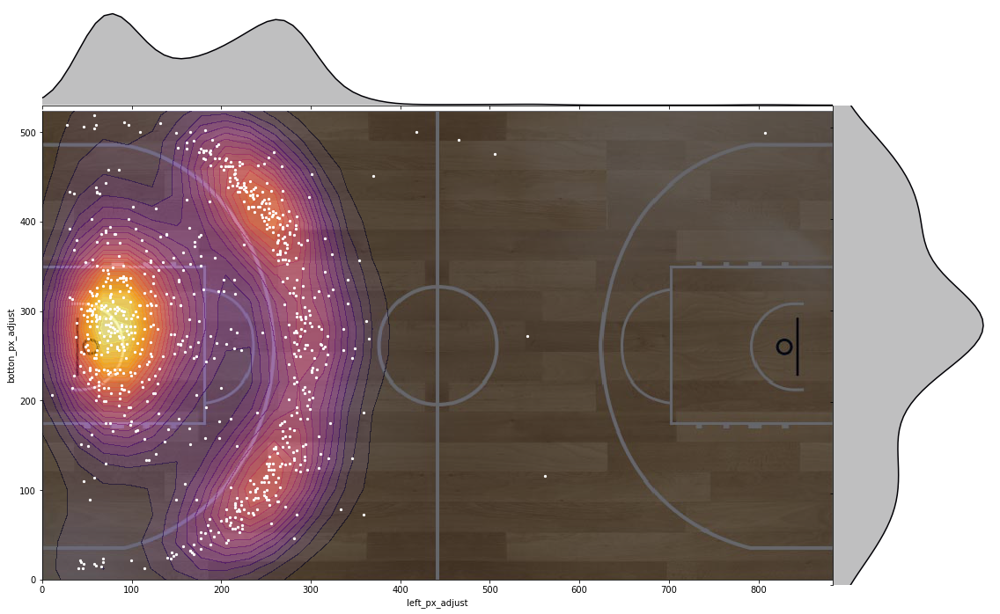

In [32]:
# create our jointplot
aux_df=shot_df[(shot_df.actor_id==9) ]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut.png')

# construct cmap
# Register and set Viridis as the colormap for the plot
cmap=plt.cm.inferno


# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100, 
                                stat_func=None,
                                 kind='kde',space=0,color=cmap(1),
                                 cmap=cmap, n_levels=30,alpha=0.6,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                 joint_kws={"cut":30})

joint_shot_chart.plot_joint(plt.scatter, c="w", s=5, linewidth=1, marker="o")


joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)


# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint

ax.imshow(img, origin='lower')

plt.show()

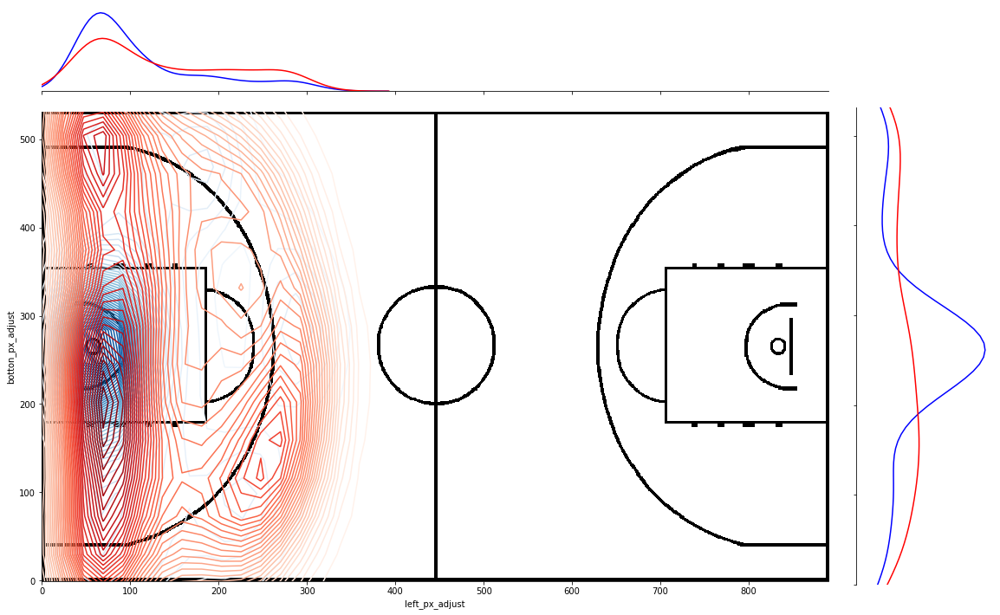

In [34]:
# create our jointplot
aux_df_scored=shot_df[(shot_df.actor_id==2)&(shot_df.scored==1)]
aux_df
aux_df_missed=shot_df[(shot_df.actor_id==2)&(shot_df.scored==0)]

# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut_WB.png')

# construct cmap
# Register and set Viridis as the colormap for the plot
cmap=plt.cm.inferno


# n_levels sets the number of contour lines for the main kde plot
g = sns.JointGrid(x="left_px_adjust",y="botton_px_adjust",data=aux_df)

sns.kdeplot(aux_df_scored.left_px_adjust*img.shape[1]/100, aux_df_scored.botton_px_adjust*img.shape[0]/100, cmap="Blues",
            n_levels=50, shade_lowest=True, ax=g.ax_joint,cut=30)

sns.kdeplot(aux_df_missed.left_px_adjust*img.shape[1]/100, aux_df_missed.botton_px_adjust*img.shape[0]/100, cmap="Reds",
            n_levels=50, shade_lowest=True, ax=g.ax_joint,cut=30)

sns.kdeplot(aux_df_scored.left_px_adjust*img.shape[1]/100, color="b", legend=False,  
             ax=g.ax_marg_x)
sns.kdeplot(aux_df_missed.left_px_adjust*img.shape[1]/100, color="r", legend=False, 
             ax=g.ax_marg_x)
sns.kdeplot(aux_df_scored.botton_px_adjust*img.shape[0]/100, color="b", legend=False, 
             ax=g.ax_marg_y, vertical=True)
sns.kdeplot(aux_df_missed.botton_px_adjust*img.shape[0]/100, color="r", legend=False, 
             ax=g.ax_marg_y, vertical=True)

g.fig.set_figwidth(img.shape[1]/100*2)
g.fig.set_figheight(img.shape[0]/100*2)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = g.ax_joint

ax.imshow(img, origin='lower')



plt.show()

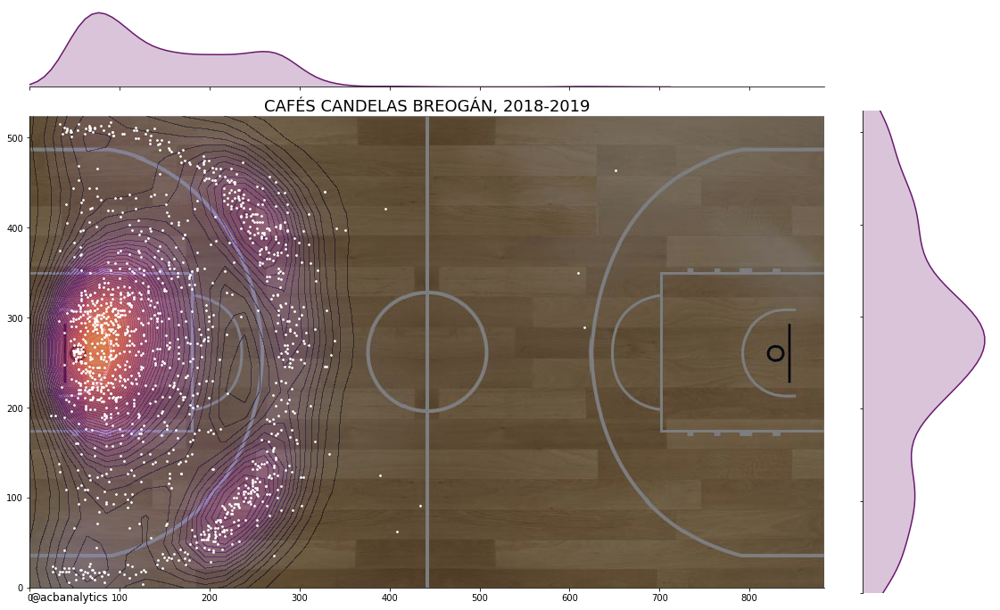

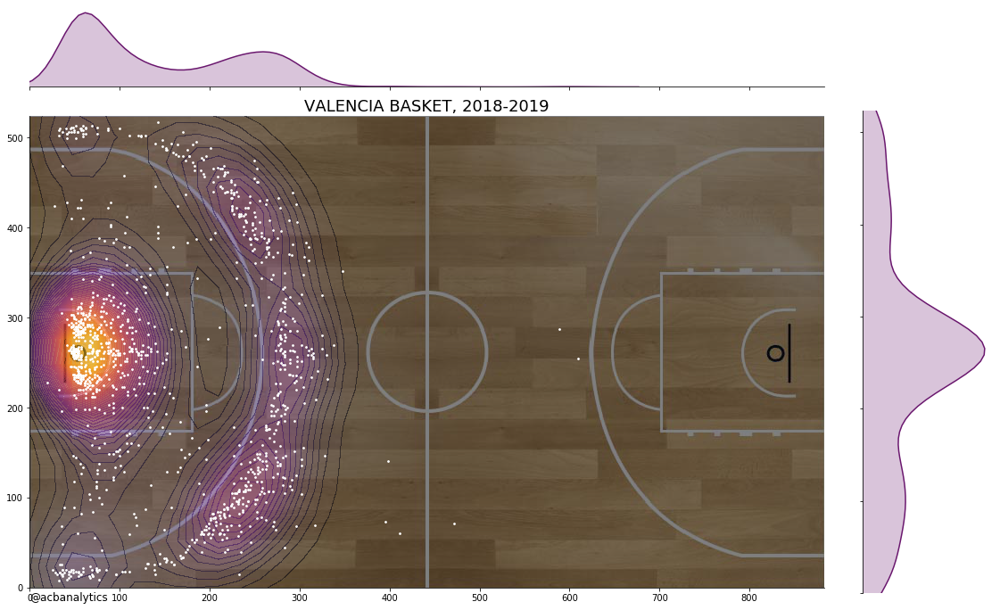

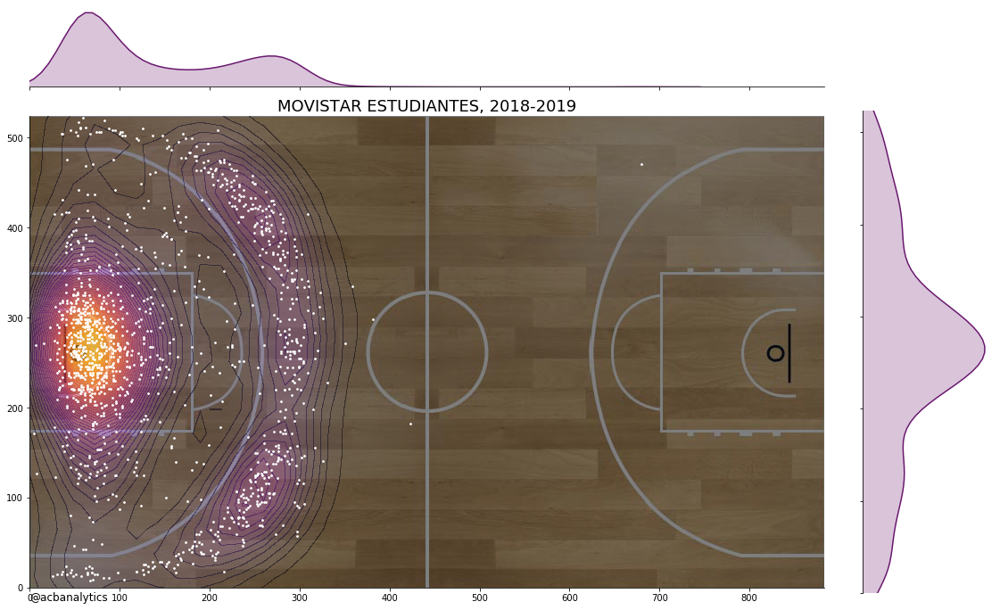

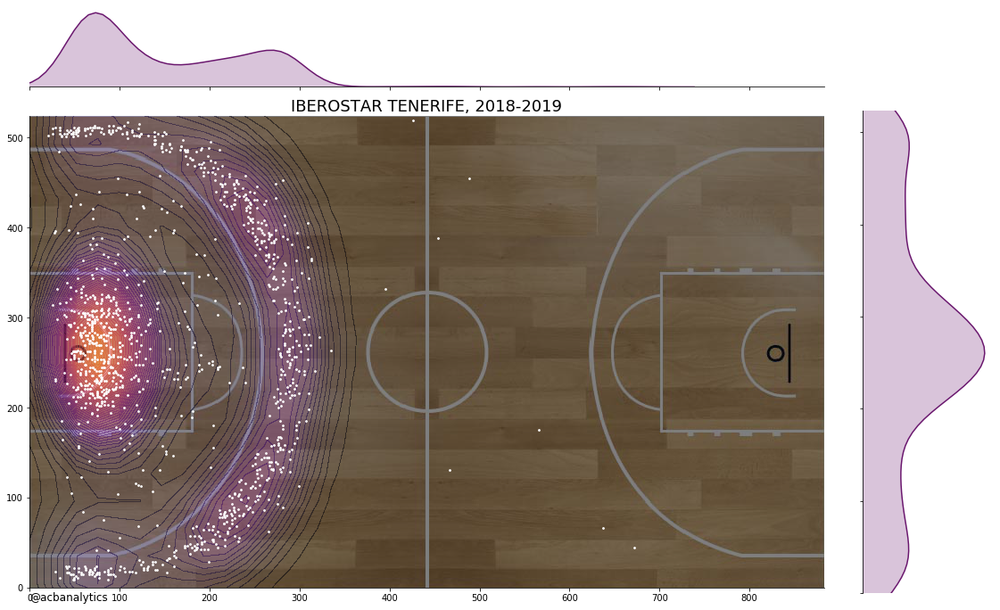

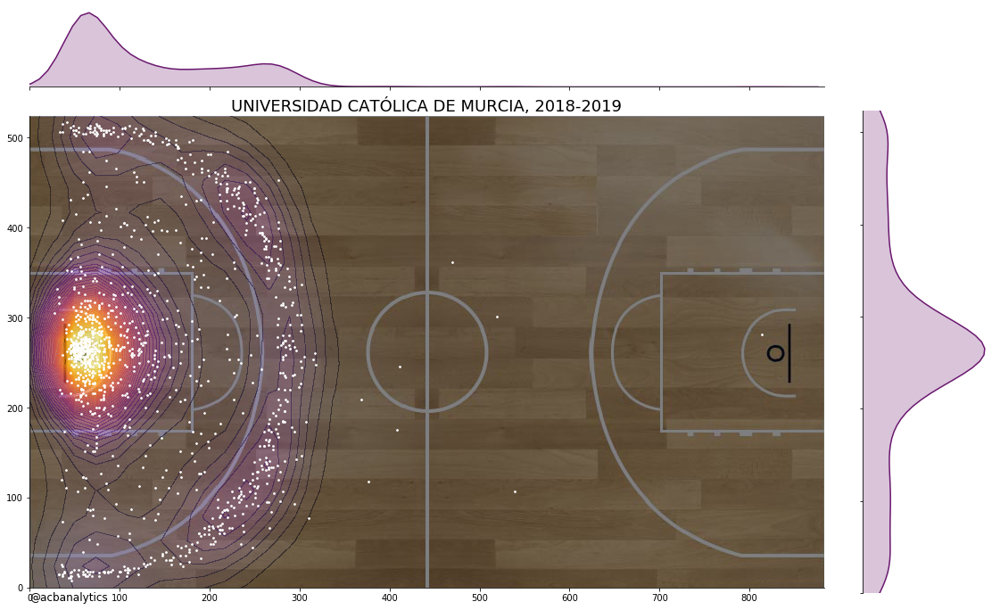

...

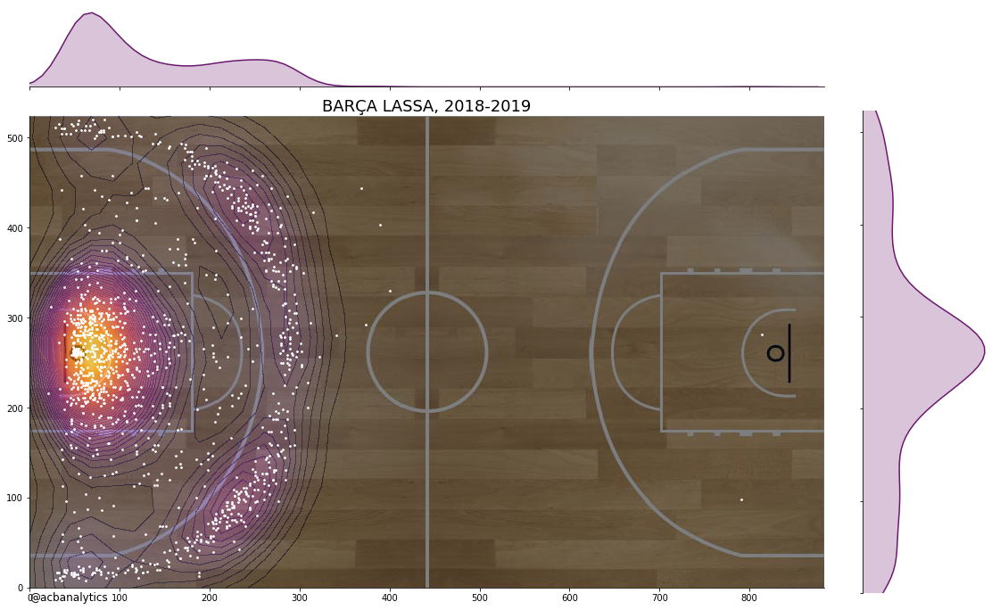

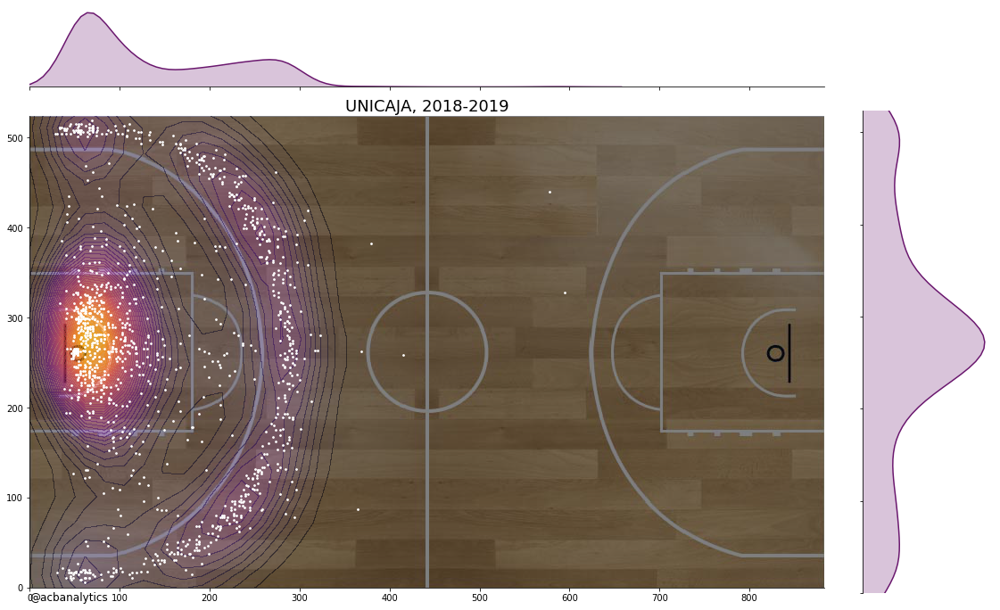

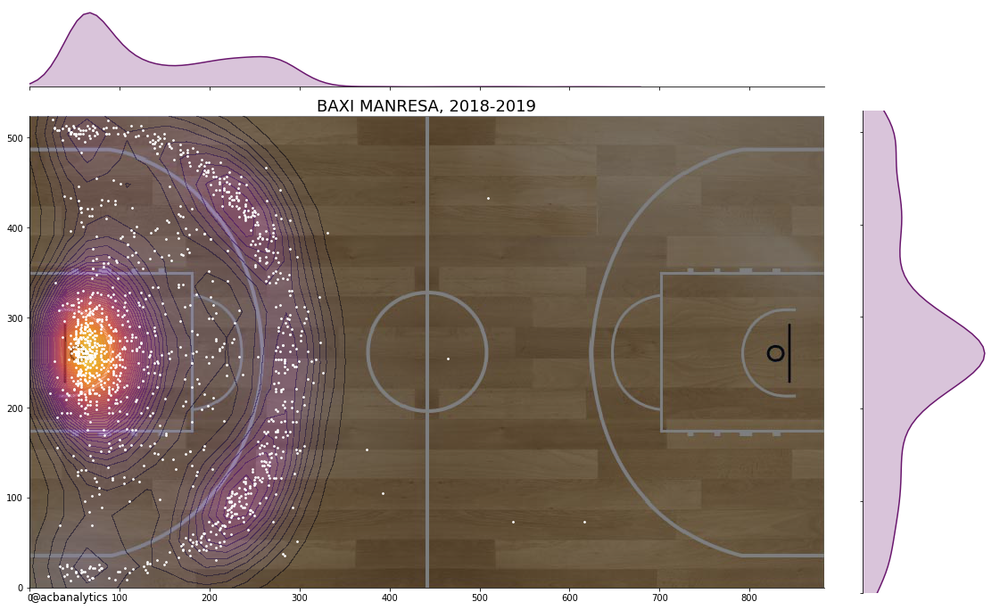

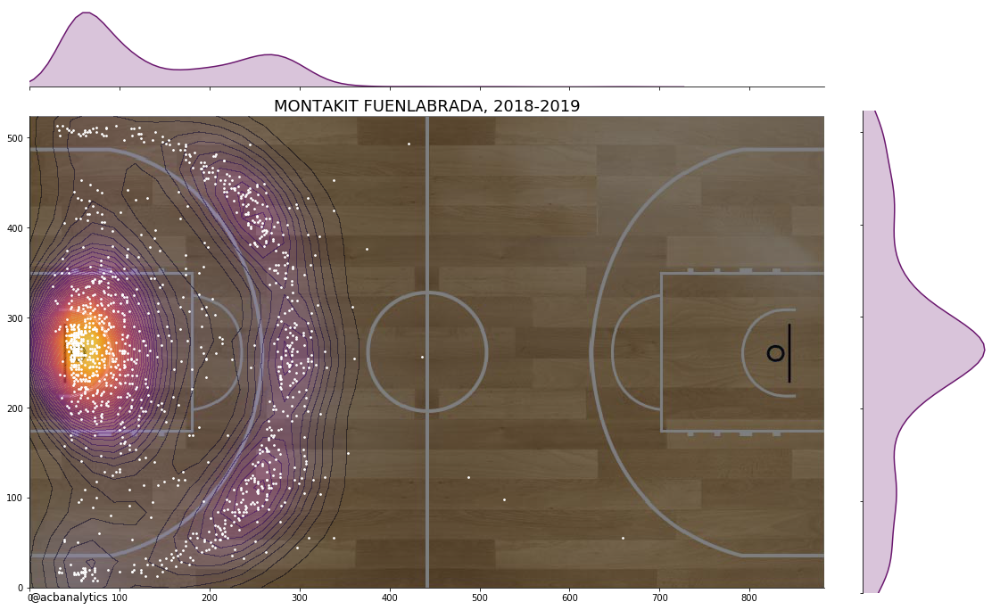

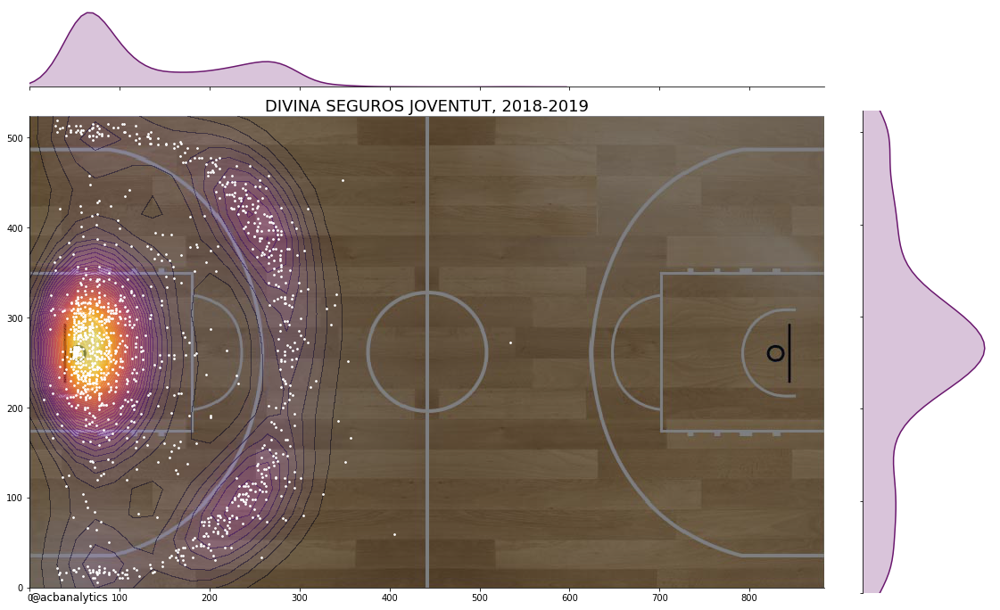

In [40]:
from matplotlib.offsetbox import  OffsetImage
import palettable

df_season=shot_df[(shot_df.game_acbid>=63000)]

teams=df_season['team_id'].unique()
for team in teams:
    # create our jointplot
    aux_df=df_season[(df_season.team_id==team)]
    team_name=team_df.name[(team_df.team_id==team)].iloc[-1]

    # get our colormap for the main kde plot
    # Note we can extract a color from cmap to use for 
    # the plots that lie on the side and top axes
    img=mpimg.imread('fiba_courtonly_cut.png')

    # construct cmap
    # Register and set Viridis as the colormap for the plot
    cmap=plt.cm.inferno

    # n_levels sets the number of contour lines for the main kde plot
    joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100, 
                                    stat_func=None,
                                     kind='kde',space=0.3,color=cmap(0.3),
                                     cmap=cmap, n_levels=50,alpha=0.5,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                     joint_kws={"cut":30,"vmin":0,"vmax":0.0000420})

    joint_shot_chart.plot_joint(plt.scatter, c="w", s=3, linewidth=1, marker="o")
    
    # A joint plot has 3 Axes, the first one called ax_joint 
    # is the one we want to draw our court onto and adjust some other settings
    ax = joint_shot_chart.ax_joint
    
     # Get rid of axis labels and tick marks
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    # Add a title
    ax.set_title('{}, 2018-2019'.format(team_name), y=1.2, fontsize=18)
    
    # Add Data Scource and Author
    ax.text(0,-15,'@acbanalytics',fontsize=12)

    ax.imshow(img, origin='lower')
    #plt.title(label=team,fontdict={'fontsize':20},loc="center")
    
    joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
    joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)
    
    plt.show()

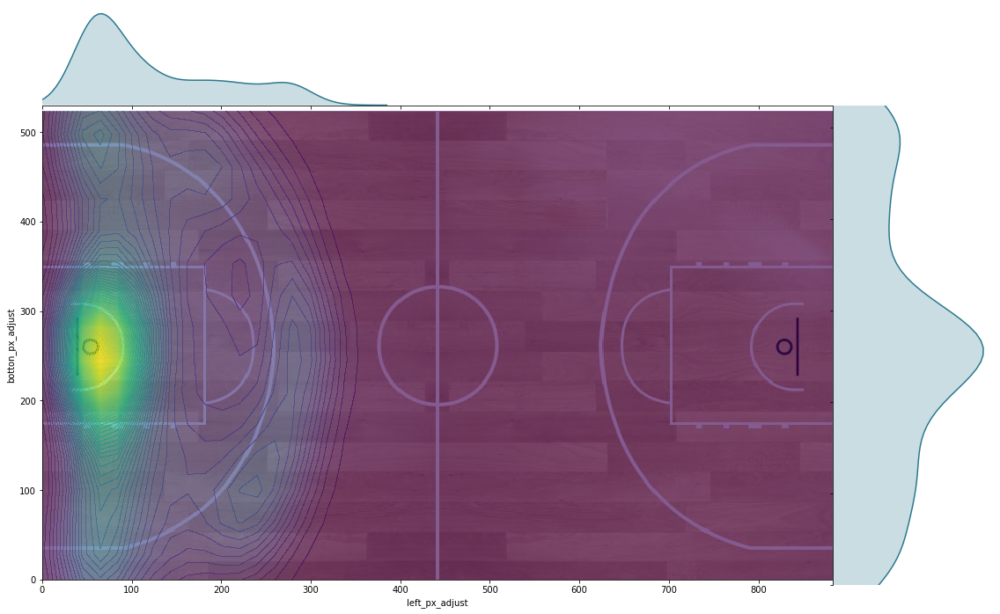

In [41]:
from matplotlib.offsetbox import  OffsetImage
import palettable
from matplotlib.colors import ListedColormap

# create our jointplot
aux_df=shot_df[(shot_df.actor_id==2) ]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut.png')


# construct cmap
# Register and set Viridis as the colormap for the plot
cmap=plt.cm.viridis



# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100, 
                                stat_func=None,
                                 kind='kde',space=0,color=cmap(0.4),
                                 cmap=cmap, n_levels=50,alpha=0.65,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                 joint_kws={"cut":30})

joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint

ax.imshow(img, origin='lower')



plt.show()

In [48]:
aux_df=shot_df[(shot_df.team_id==1) | (shot_df.team_id==2) | (shot_df.team_id==3)
               | (shot_df.team_id==6)| (shot_df.team_id==8)| (shot_df.team_id==9)
               | (shot_df.team_id==13)| (shot_df.team_id==18) & (shot_df.game_acbid>=63000)]

aux_df_final=aux_df.copy()
aux_df_final['left_m_adjust']=(aux_df_final['left_px_adjust']*28)/100
aux_df_final['botton_m_adjust']=(aux_df_final['botton_px_adjust']*15)/100

center=1.575,7.5

aux_df_final['distance']=aux_df_final.apply(lambda row: math.sqrt((row['left_m_adjust']-center[0])**2+(row['botton_m_adjust']-center[1])**2), axis=1)
aux_df_final

actor_dist={}
actors=df_season['actor_id'].unique()
for actor in actors:
    #print(actor)
    
    actor_df=aux_df_final[(aux_df_final.actor_id==actor)]
    actor_df['sum']=1
    suma=actor_df['sum'].sum()
    if suma >= 20:
        actor_dist[actor]=actor_df["distance"].mean()
    
actor_dist

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


{159: 5.2514722574115815,
 163: 4.7488143555195075,
 158: 5.568239446757778,
 28: 4.048093430187039,
 30: 5.82514455439498,
 31: 3.0655432173277717,
 29: 3.3542725501920923,
 34: 5.5284492611747025,
 32: 3.4839409692740615,
 27: 6.885416581920053,
 35: 4.155039225212998,
 36: 6.15743010636053,
 155: 2.6953638735678283,
 209: 4.7840071434508245,
 101: 3.77920936000508,
 201: 2.8415967552469343,
 203: 4.563673382735599,
 205: 6.829172646016692,
 210: 2.03200131275374,
 204: 4.704902288043851,
 202: 5.637768083927964,
 200: 5.672035483400947,
 206: 4.873220452309469,
 24: 5.131154747453483,
 257: 5.599637077284497,
 16: 1.5377120041588852,
 25: 4.909438143911038,
 22: 6.098050035132873,
 261: 6.488557060332731,
 18: 1.3274586452897448,
 19: 5.908412871720578,
 20: 5.448646726676238,
 14: 5.834288051831559,
 122: 5.371326993653556,
 124: 1.1985773762476994,
 152: 3.7308943662658507,
 33: 5.581081903398823,
 10: 2.671214976929994,
 9: 5.417920248411802,
 8: 1.2902237952677975,
 1: 3.9908225

In [49]:
actor_dist
#final_df=pd.DataFrame(actor_dist.items(),columns=['Date', 'DateValue']) 
#final_df
df = pd.DataFrame(list(actor_dist.items()), columns=['actor_id', 'distance'])
df=df.dropna()
df=df.sort_values('distance')
df

,actor_id,distance
85,49,1.113436
115,60,1.116938
34,124,1.198577
46,39,1.247184
104,87,1.269285
39,8,1.290224
29,18,1.327459
59,181,1.332978
114,40,1.379207
49,69,1.388869


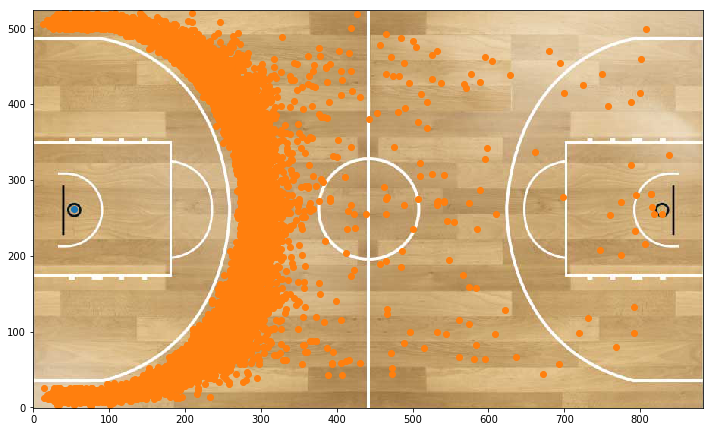

883

In [50]:
img=mpimg.imread('fiba_courtonly_cut.png')
aux_df=aux_df[aux_df.distance>=6.75]

plt.figure(figsize=(12,22))
plt.scatter(6*img.shape[1]/100,50*img.shape[0]/100)
plt.scatter(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100)

imgplot = plt.imshow(img, origin='lower')
plt.show()
img.shape[0]
img.shape[1]

In [52]:
df_mandarinas=shot_df[(shot_df['distance']>=20) & (shot_df['game_acbid']>=63000)]
df_mandarinas

,id,shotchart_game_acbid,game_acbid,team_id,actor_id,jersey,scored,period,shot,shot_type,botton_px,left_px,botton_px_adjust,left_px_adjust,left_m_adjust,botton_m_adjust,distance
475,476,977779,63010,1,4,7,0,1,3PT,None,24.150,14.208,75.850,85.792,24.02176,11.37750,22.779202
5368,5369,977770,63002,6,174,3,0,2,3PT,None,13.265,21.311,86.735,78.689,22.03292,13.01025,21.187009
7184,7185,977999,63136,17,240,40,0,3,3PT,None,11.905,78.142,11.905,78.142,21.87976,1.78575,21.093504
8160,8161,977886,63091,4,100,31,1,1,2PT,layup,57.483,6.922,42.517,93.078,26.06184,6.37755,24.512552
9270,9271,977912,63100,2,63,30,0,1,3PT,None,18.707,89.617,18.707,89.617,25.09276,2.80605,23.981622
10585,10586,978033,63167,8,15,1,0,3,3PT,None,8.503,76.138,8.503,76.138,21.31864,1.27545,20.701602
13862,13863,977976,63126,7,134,9,1,OT,3PT,None,10.544,74.681,10.544,74.681,20.91068,1.58160,20.221177
14148,14149,977832,63061,17,74,23,0,2,2PT,tip,53.741,92.168,53.741,92.168,25.80704,8.06115,24.238537
16427,16428,977801,63032,13,203,8,0,3,3PT,None,10.204,22.951,89.796,77.049,21.57372,13.46940,20.870614
16617,16618,977806,63036,16,112,13,0,2,3PT,None,51.020,83.060,51.020,83.060,23.25680,7.65300,21.682340


Populating the interactive namespace from numpy and matplotlib


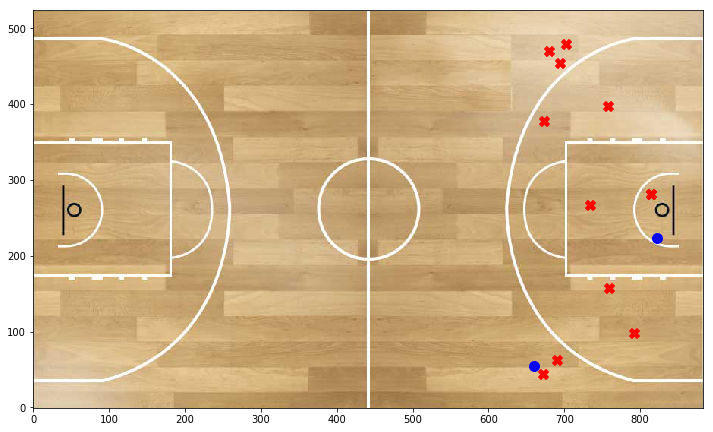

In [53]:
img=mpimg.imread('fiba_courtonly_cut.png')

aux1=df_mandarinas[df_mandarinas['scored']==1]
aux2=df_mandarinas[df_mandarinas['scored']==0]
colors1=np.where(aux1.team_id==teams[0],'blue','black')
colors2=np.where(aux2.team_id==teams[0],'blue','black')

plt.figure(figsize=(12,22))
plt.scatter(aux1.left_px_adjust*img.shape[1]/100,aux1.botton_px_adjust*img.shape[0]/100,c="Blue",marker='o',s=100)
plt.scatter(aux2.left_px_adjust*img.shape[1]/100,aux2.botton_px_adjust*img.shape[0]/100,c="red",marker='X',s=100)

imgplot = plt.imshow(img, origin='lower')
plt.show()

In [54]:
# Database connection
conn = pymysql.connect(user='root', password='root', database='acb', host='localhost')

# Load the data into a Pandas DataFrame
query = "SELECT * FROM acb.shotchart LEFT JOIN acb.actor on shotchart.actor_id = actor.id where (actor.position='P') and shotchart.distance<=2.45 and shotchart.team_id!=8 and shotchart.game_acbid>=63000"
shot_df_aux = pd.read_sql(query, conn)
shot_df_aux

,id,shotchart_game_acbid,game_acbid,team_id,actor_id,jersey,scored,period,shot,shot_type,...,full_name,nationality,birth_place,birth_date,position,height,weight,license,debut_acb,twitter
0,672,977769,63001,1,6,14,0,1,2PT,jumpshot,...,Gustavo Alfonso Ayón Aguirre,ESP,Tepic,1985-04-01,P,2.07,NaN,EUR,None,None
1,673,977769,63001,1,6,14,0,1,2PT,jumpshot,...,Gustavo Alfonso Ayón Aguirre,ESP,Tepic,1985-04-01,P,2.07,NaN,EUR,None,None
2,677,977769,63001,1,6,14,0,2,2PT,jumpshot,...,Gustavo Alfonso Ayón Aguirre,ESP,Tepic,1985-04-01,P,2.07,NaN,EUR,None,None
3,678,977769,63001,1,6,14,1,2,2PT,tip,...,Gustavo Alfonso Ayón Aguirre,ESP,Tepic,1985-04-01,P,2.07,NaN,EUR,None,None
4,684,977769,63001,1,6,14,0,2,2PT,tip,...,Gustavo Alfonso Ayón Aguirre,ESP,Tepic,1985-04-01,P,2.07,NaN,EUR,None,None
5,685,977769,63001,1,6,14,0,2,2PT,jumpshot,...,Gustavo Alfonso Ayón Aguirre,ESP,Tepic,1985-04-01,P,2.07,NaN,EUR,None,None
6,689,977769,63001,1,6,14,1,2,2PT,tip,...,Gustavo Alfonso Ayón Aguirre,ESP,Tepic,1985-04-01,P,2.07,NaN,EUR,None,None
7,691,977769,63001,1,6,14,0,2,2PT,jumpshot,...,Gustavo Alfonso Ayón Aguirre,ESP,Tepic,1985-04-01,P,2.07,NaN,EUR,None,None
8,694,977769,63001,1,6,14,1,2,2PT,layup,...,Gustavo Alfonso Ayón Aguirre,ESP,Tepic,1985-04-01,P,2.07,NaN,EUR,None,None
9,710,977769,63001,1,6,14,0,3,2PT,jumpshot,...,Gustavo Alfonso Ayón Aguirre,ESP,Tepic,1985-04-01,P,2.07,NaN,EUR,None,None


In [61]:
shot_df_scored=shot_df_aux[shot_df_aux['scored']==1]
shot_df_missed=shot_df_aux[shot_df_aux['scored']==0]
shot_df_missed['scored']=1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [62]:
print(shot_df_missed.shape)
print(shot_df_scored.shape)

shot_df_scored=shot_df_scored.groupby(['team_id']).sum()

shot_df_missed=shot_df_missed.groupby(['team_id']).sum()

(933, 31)
(1767, 31)


In [63]:
shot_df_scored['scored']=shot_df_scored['scored']/10
print(shot_df_scored['scored'])
print(shot_df_scored['scored'].mean())

shot_df_missed['scored']=shot_df_missed['scored']/20
print(shot_df_missed['scored'])
print(shot_df_missed['scored'].mean())

team_id
1     10.8
2     12.8
3     13.7
4     10.7
5      8.9
6     13.7
7      5.7
9      7.9
10    12.7
11    11.7
12     6.8
13    11.6
14     5.3
15    14.6
16     5.2
17    10.4
18    14.2
Name: scored, dtype: float64
10.394117647058822
team_id
1     2.15
2     2.80
3     3.45
4     2.90
5     2.40
6     3.55
7     2.35
9     2.30
10    3.25
11    2.95
12    2.15
13    3.05
14    1.60
15    3.90
16    1.50
17    3.05
18    3.30
Name: scored, dtype: float64
2.744117647058823


In [64]:
# Database connection
conn = pymysql.connect(user='root', password='root', database='acb', host='localhost')

# Load the data into a Pandas DataFrame
query = "SELECT DISTINCT game_acbid FROM acb.event WHERE team_id = 8 AND game_acbid > 63000"
tenerife_df = pd.read_sql(query, conn)

list_games = tenerife_df['game_acbid'].tolist()
list_games= ','.join(str(e) for e in list_games)
print("Lista de sus partidos: " + list_games)
query = "SELECT * FROM acb.shotchart LEFT JOIN acb.actor on shotchart.actor_id = actor.id WHERE game_acbid IN (%s) and team_id!=8 and shotchart.distance<=2.45 and (actor.position='P')" % list_games
tenerife_df = pd.read_sql(query, conn)

Lista de sus partidos: 63161,63001,63018,63023,63079,63178,63089,63056,63050,63094,63167,63123,63106,63147,63117,63127,63036,63067,63141,63040


In [65]:
tenerife_df_scored=tenerife_df[tenerife_df['scored']==1]
tenerife_df_missed=tenerife_df[tenerife_df['scored']==0]

tenerife_df_scored=tenerife_df_scored.groupby(['team_id']).sum()
tenerife_df_scored

,id,shotchart_game_acbid,game_acbid,actor_id,jersey,scored,botton_px,left_px,botton_px_adjust,left_px_adjust,left_m_adjust,botton_m_adjust,distance,id,is_coach,height,weight
team_id,,,,,,,,,,,,,,,,,
1,4208,5866614,378006,40,100,6,297.618,296.904,311.224,34.792,9.74176,46.68360,2.803779,40,0,12.68,0.0
2,83998,7823400,504898,693,249,8,382.992,402.915,389.796,60.839,17.03492,58.46940,13.136461,693,0,17.27,595.0
3,92226,5867862,378762,288,138,6,306.461,298.725,300.339,44.991,12.59748,45.05085,3.778177,288,0,12.54,380.0
4,59775,5866956,378300,576,141,6,329.932,383.970,309.524,37.888,10.60864,46.42860,5.825203,576,0,12.53,309.0
5,5583,2933376,189069,582,96,3,146.938,26.776,146.938,26.776,7.49728,22.04070,4.212221,582,0,6.48,0.0
6,47557,3911692,252424,722,63,4,204.082,281.602,180.272,36.612,10.25136,27.04080,5.046802,722,0,8.49,0.0
7,37505,2934030,189441,453,165,3,136.055,114.936,136.055,26.594,7.44632,20.40825,3.673114,453,0,6.39,0.0
9,87634,5867718,378702,530,394,6,303.741,379.599,280.611,45.539,12.75092,42.09165,5.889718,530,0,12.30,0.0
10,79692,11735538,757602,2164,244,12,587.414,603.462,601.020,120.766,33.81448,90.15300,18.705892,2164,0,25.15,416.0


In [66]:
tenerife_df_scored['scored']=tenerife_df_scored['scored']

tenerife_df_scored
print(tenerife_df_scored['scored'].sum())

tenerife_df_missed['scored']=tenerife_df_missed['scored']
tenerife_df_missed
print(tenerife_df_missed['scored'].sum())

93
0


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [67]:
(163-7.5-9.5-9)/17*2

16.11764705882353